# Uber pickups

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

%matplotlib inline

from tqdm import tqdm
tqdm.pandas()

In [2]:
df = pd.read_csv('./Datasets/uber-raw-data-apr14.csv', infer_datetime_format=True, parse_dates=[0])

# Data prep

In [3]:
ny = gpd.read_file('./shapefile/ny.shp')
crs = {'init': 'epsg:4326'}

In [4]:
df['Hour'] = df['Date/Time'].dt.hour

In [5]:
df['Weekday'] = df['Date/Time'].dt.weekday

In [6]:
def split_time(x):
    if x >= 22 or x <= 5:
        return "night"
    elif x >= 6 and x <= 12:
        return "am"
    elif x >= 13 and x <= 17:
        return "pm"
    else:
        return "evening"

In [7]:
def apply_weekday(x):
    if x == 0:
        return "monday"
    elif x == 1:
        return "tuesday"
    elif x == 2:
        return "wednesday"
    elif x == 3:
        return "thursday"
    elif x == 4:
        return "friday"
    elif x == 5:
        return "saturday"
    else:
        return "sunday"

In [8]:
def count_rows(rows):
    return len(rows)

In [9]:
df['Period'] = df['Hour'].progress_apply(lambda x: split_time(x))

100%|██████████| 564516/564516 [00:00<00:00, 866579.19it/s]


In [10]:
df['Day'] = df['Weekday'].progress_apply(lambda x: apply_weekday(x))

100%|██████████| 564516/564516 [00:00<00:00, 742030.71it/s]


In [11]:
df['Day - Period'] = df[['Day', 'Period']].progress_apply(lambda x: '_'.join(x), axis=1)

100%|██████████| 564516/564516 [00:04<00:00, 122028.71it/s]


In [12]:
df['Day of month'] = df['Date/Time'].dt.day

# Geo dataviz

In [13]:
dict_of_df = dict(iter(df.groupby('Day - Period')))

In [14]:
list_df = [
 'monday_am',
 'monday_pm',
 'monday_evening',
 'monday_night',
 'tuesday_am',
 'tuesday_pm',
 'tuesday_evening',
 'tuesday_night',
 'wednesday_am',
 'wednesday_pm',
 'wednesday_evening',
 'wednesday_night',
 'thursday_am',
 'thursday_pm',
 'thursday_evening',
 'thursday_night',
 'friday_am',
 'friday_pm',
 'friday_evening',
 'friday_night',
 'saturday_am',
 'saturday_pm',
 'saturday_evening',
 'saturday_night',
 'sunday_am',
 'sunday_pm',
 'sunday_evening',
 'sunday_night']

In [15]:
geometry = [Point(xy) for xy in zip( dict_of_df['monday_night'].Lon, dict_of_df['monday_night'].Lat )]
geometry[:3]

In [16]:
geo_df = gpd.GeoDataFrame(dict_of_df['monday_night'], crs=crs, geometry=geometry)
geo_df.head()

,Date/Time,Lat,Lon,Base,Hour,Weekday,Period,Day,Day - Period,Day of month,geometry
7785,2014-04-07 00:31:00,40.7205,-73.9939,B02512,0,0,night,monday,monday_night,7,POINT (-73.99390 40.72050)
7786,2014-04-07 00:37:00,40.7407,-74.0077,B02512,0,0,night,monday,monday_night,7,POINT (-74.00770 40.74070)
7787,2014-04-07 00:50:00,40.7591,-73.9892,B02512,0,0,night,monday,monday_night,7,POINT (-73.98920 40.75910)
7788,2014-04-07 00:58:00,40.7419,-74.0034,B02512,0,0,night,monday,monday_night,7,POINT (-74.00340 40.74190)
7789,2014-04-07 01:27:00,40.7419,-74.0034,B02512,1,0,night,monday,monday_night,7,POINT (-74.00340 40.74190)


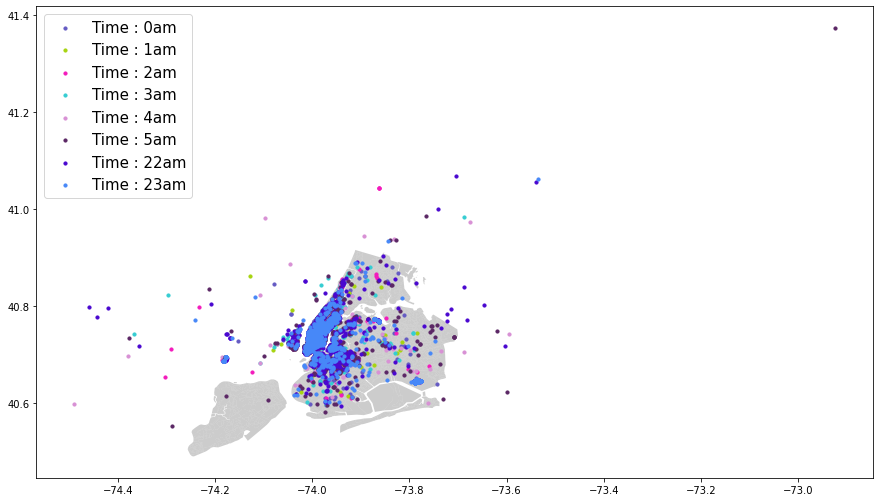

In [17]:
import random

time = geo_df['Hour'].unique()

fig, ax = plt.subplots(figsize=(15,15))

ny.plot(ax=ax, alpha=0.4, color='grey')

color = ["#"+''.join([random.choice('0123456789ABCDEF') 
                      for j in range(6)]) for i in range(len(geo_df['Hour'].unique()))]

for z, i in enumerate(time):
    geo_df[geo_df['Hour'] == i].plot(ax=ax, markersize=10, color=color[z], label=f'Time : {time[z]}am')

plt.legend(prop={'size': 15})